# Transferência de professores e rendimento da escola. 

In [10]:
import networkx as nx
import freeman as fm
import statsmodels.api as sm
import json
import pandas as pd
import seaborn as sns

#### Carregando os arquivos utilizados:

In [11]:
g = fm.load('bbb.gml')

with open('uwu.json') as json_file: 
    data = json.load(json_file) 

In [12]:
len(g.nodes)

543

### Extraindo o Idep 

In [13]:
idep = []
for i in g.nodes:
    for j in data:
        if i == j:
            idep.append(data[j])

### Extraindo o  Indicador de Complexidade de Gestão (ICG) 

In [14]:
icg = []
for i in g.nodes:
    icg.append(int(g.nodes[i]["icg"]))

### Extraindo o  Indicador de Nível Socioeconômico (REN) 

In [15]:
ren = []
for i in g.nodes:
    ren.append(int(g.nodes[i]["ren"]))

### Gerando a rede:

In [16]:
g.label_nodes()
g.set_all_nodes(size=15, labpos='hover')
g.set_all_edges(color=(0, 0, 0, 0.5))
g.draw()

In [17]:
g.interact()

### Pagerank

In [8]:
gv = g.reverse()

In [9]:
pr = nx.pagerank_numpy(gv)
reci = []
for i in pr.values():
    reci.append(i)

### Regressão com a variável de controle:::::::::::::::


In [16]:
model = sm.OLS(idep, ren)
result = model.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.979
Model:                            OLS   Adj. R-squared (uncentered):              0.979
Method:                 Least Squares   F-statistic:                          2.579e+04
Date:                Mon, 16 Nov 2020   Prob (F-statistic):                        0.00
Time:                        10:00:50   Log-Likelihood:                         -557.35
No. Observations:                 543   AIC:                                      1117.
Df Residuals:                     542   BIC:                                      1121.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.2375      0.008    160.594      0.000       1.222       1.253
==============================================================================
Omnibus:                      194.373   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1362.299
Skew:                          -1.390   Prob(JB):                    1.52e-296
Kurtosis:                      10.244   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Hipótese I:
Quanto maior o indicador de complexidade, menor a nota do IDEP.

In [11]:
d = {'icg': icg, 'ren': ren}
df = pd.DataFrame(data=d)

In [18]:
model = sm.OLS(idep, df)
result = model.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.980
Model:                            OLS   Adj. R-squared (uncentered):              0.980
Method:                 Least Squares   F-statistic:                          1.340e+04
Date:                Mon, 16 Nov 2020   Prob (F-statistic):                        0.00
Time:                        10:01:03   Log-Likelihood:                         -546.58
No. Observations:                 543   AIC:                                      1097.
Df Residuals:                     541   BIC:                                      1106.
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
icg            0.2487      0.053      4.680      0.000       0.144       0.353
ren            1.1493      0.020     56.552      0.000       1.109       1.189
==============================================================================
Omnibus:                      208.415   Durbin-Watson:                   2.052
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1490.241
Skew:                          -1.506   Prob(JB):                         0.00
Kurtosis:                      10.537   Cond. No.                         7.93
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Hipótese II:
Professores tendem a se transferir para escolas com melhor qualidade de ensino, ou seja, quanto maior o indicador de recebimento de professores vindos de escolas influentes, maior o IDEP dessa escola.

In [13]:
e = {'rec': reci, 'ren': ren}
ef = pd.DataFrame(data=d)

In [43]:
model = sm.OLS(idep, reci)
result = model.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.861
Model:                            OLS   Adj. R-squared (uncentered):              0.861
Method:                 Least Squares   F-statistic:                              3360.
Date:                Mon, 16 Nov 2020   Prob (F-statistic):                   1.75e-234
Time:                        10:49:41   Log-Likelihood:                         -1075.7
No. Observations:                 543   AIC:                                      2153.
Df Residuals:                     542   BIC:                                      2158.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1          2240.3613     38.650     57.965      0.000    2164.439    2316.284
==============================================================================
Omnibus:                       68.423   Durbin-Watson:                   1.746
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               99.235
Skew:                          -0.866   Prob(JB):                     2.83e-22
Kurtosis:                       4.178   Cond. No.                         1.00
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Todas as variáveis juntas:

In [20]:
t = {'rec': reci, 'ren': ren, 'icg': icg}
tf = pd.DataFrame(data=t)

In [21]:
model = sm.OLS(idep, tf)
result = model.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.981
Model:                            OLS   Adj. R-squared (uncentered):              0.980
Method:                 Least Squares   F-statistic:                              9098.
Date:                Mon, 16 Nov 2020   Prob (F-statistic):                        0.00
Time:                        10:03:35   Log-Likelihood:                         -541.28
No. Observations:                 543   AIC:                                      1089.
Df Residuals:                     540   BIC:                                      1101.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
rec          137.8252     42.250      3.262      0.001      54.830     220.821
ren            1.1110      0.023     47.653      0.000       1.065       1.157
icg            0.1703      0.058      2.940      0.003       0.057       0.284
==============================================================================
Omnibus:                      205.486   Durbin-Watson:                   2.050
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1404.418
Skew:                          -1.496   Prob(JB):                    1.08e-305
Kurtosis:                      10.289   Cond. No.                     5.99e+03
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 5.99e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [28]:
v = {'idep': idep,'rec': reci, 'ren': ren, 'icg': icg}
vf = pd.DataFrame(data=v)

<AxesSubplot:xlabel='ren', ylabel='idep'>

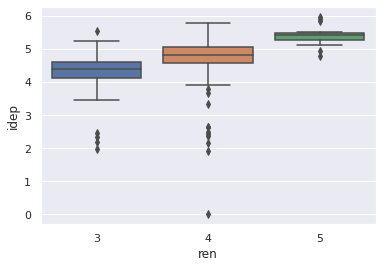

In [31]:
sns.boxplot(data=vf, x="ren", y="idep")

<AxesSubplot:xlabel='icg', ylabel='idep'>

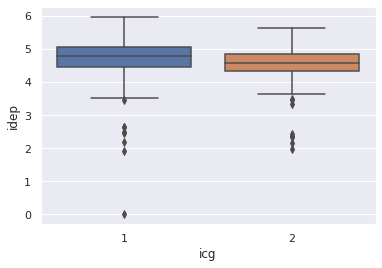

In [32]:
sns.boxplot(data=vf, x="icg", y="idep")

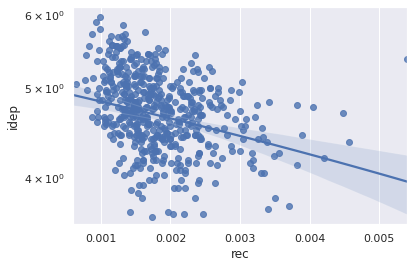

In [42]:
y = sns.regplot(data=vf, x="rec", y="idep")
y.set_yscale('log')

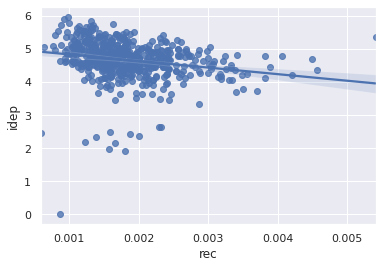

In [44]:
y = sns.regplot(data=vf, x="rec", y="idep")